# Vertical Line Test

## 1.1 Create two graphs, one that passes the vertical line test and one that does not.

Create and plot the line, that passes the vertical line test

In [4]:
import numpy as np

x_test = np.random.random_sample(10)
y_test = x_test*2 + 3

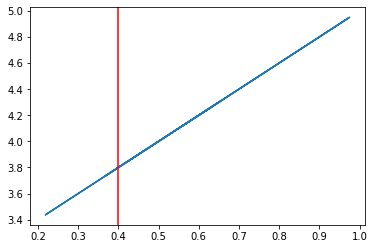

In [12]:
import matplotlib.pyplot as plt

plt.plot(x_test, y_test)
plt.axvline(x=.4, color='red');

Create and plot the line that does not pass the vertical line test 

In [23]:
x_no_test = np.random.random_sample(10)
y_no_test = 1/x_no_test

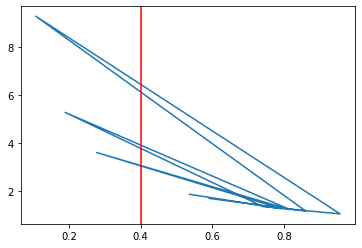

In [24]:
import matplotlib.pyplot as plt

plt.plot(x_no_test, y_no_test)
plt.axvline(x=.4, color='red');

## 1.2 Why are graphs that don't pass the vertical line test not considered "functions?"

Because for each x value multiple y values can be generated.

# Functions as Relations

## 2.1 Which of the following relations are functions? Why?

\begin{align}
\text{Relation 1: } \{(1, 2), (3, 2), (1, 3)\}
\\
\text{Relation 2: } \{(1, 3), (2, 3), (6, 7)\}
\\
\text{Relation 3: } \{(9, 4), (2, 1), (9, 6)\}
\\
\text{Relation 4: } \{(6, 2), (8, 3), (6, 4)\}
\\
\text{Relation 5: } \{(2, 6), (2, 7), (2, 4)\}
\end{align}

Only Relation 2 shoud be considered a function, because only in second relation no x value corresponds to multiple y values.  

# Functions as a mapping between dimensions


## 3.1 for the following functions what is the dimensionality of the domain (input) and codomain (range/output)?

\begin{align}
m(𝑥_1,𝑥_2,𝑥_3)=(x_1+x_2, x_1+x_3, x_2+x_3)
\\
n(𝑥_1,𝑥_2,𝑥_3,𝑥_4)=(x_2^2 + x_3, x_2x_4)
\end{align}

First function maps from three dimensions to three dimentions, second function maps from 4 dimentions to two dimentions 

## 3.2 Do you think it's possible to create a function that maps from a lower dimensional space to a higher dimensional space? If so, provide an example.

Yes, it is possible 
\begin{align}
n(𝑥_1,𝑥_2)=(x_1^2, x_1x_2, x_2^2)
\end{align}

# Vector Transformations

## 4.1 Plug the corresponding unit vectors into each function. Use the output vectors to create a transformation matrix.

\begin{align}
p(\begin{bmatrix}x_1 \\ x_2 \end{bmatrix}) = \begin{bmatrix} x_1 + 3x_2 \\2 x_2 - x_1 \\  \end{bmatrix}
\\
\\
q(\begin{bmatrix}x_1 \\ x_2 \\ x_3\end{bmatrix}) = \begin{bmatrix} 4x_1 + x_2 + 2x_3 \\2 x_2 - x_1 + 3x_3 \\ 5x_1 - 2x_3 + x_2  \end{bmatrix}
\end{align}

In [18]:
import numpy as np

# define first function
def p(vector):
  x1 = vector[0]
  x2 = vector[1]
  row1 = np.array(x1 + 3*x2)
  row2 = np.array(2*x2 - x1)
  return np.array([row1, row2])

In [21]:
# define second function
def q(vector):
  x1 = vector[0]
  x2 = vector[1]
  x3 = vector[2]
  row1 = np.array(4*x1 +x2 + 2*x3)
  row2 = np.array(-x1 +2*x2 + 3*x3)
  row3 = np.array(5*x1 +x2 - 2*x3)
  return np.array([row1, row2, row3])

In [20]:
i_hat = np.array([[1], [0]])
j_hat = np.array([[0], [1]])
a = p(i_hat)
b = p(j_hat)
P= np.column_stack([a, b])
P

array([[ 1,  3],
       [-1,  2]])

In [22]:
i = np.array([[1], [0],[0]])
j = np.array([[0], [1],[0]])
k = np.array([[0], [0],[1]])
d = q(i)
e = q(j)
f = q(k)
Q = np.column_stack([d, e, f])
Q

array([[ 4,  1,  2],
       [-1,  2,  3],
       [ 5,  1, -2]])

## 4.2 Verify that your transformation matrices are correct by choosing an input matrix and calculating the result both via the traditional functions above and also via vector-matrix multiplication.

In [27]:
input_vec = np.array([[4],[9]])
print(p(input_vec),'\n\n' ,np.matmul(P, input_vec))

[[31]
 [14]] 

 [[31]
 [14]]


In [30]:
input_vec1 = np.array([[4],[9], [5]])
print(q(input_vec1),'\n\n' ,np.matmul(Q, input_vec1))

[[35]
 [29]
 [19]] 

 [[35]
 [29]
 [19]]


# Eigenvalues and Eigenvectors

## 5.1 In your own words, give an explanation for the intuition behind eigenvalues and eigenvectors.

Eigenvector is the vector that keeps its directionality during transformation, but it can get shorter or longer. Eigenvalue represents how its eigenvector was scaled during transformation. 

# The Curse of Dimensionality

## 6.1 What are some of the challenges of working with high dimensional spaces?

overfitting
redundunt information 
repetition 


## 6.2 What is the rule of thumb for how many observations you should have compared to parameters in your model?

10x

# Principal Component Analysis

## 7.1 Code for loading and cleaning the 2013 national dataset from the [Housing Affordability Data System (HADS)](https://www.huduser.gov/portal/datasets/hads/hads.html) --housing data, can be found below. 

## Perform PCA on the processed dataset `national_processed` (Make sure you standardize your data!) and then make a scatterplot of PC1 against PC2. Some of our discussion and work around PCA with this dataset will continue during tomorrow's lecture and assignment.

Not only does this dataset have decent amount columns to begin with (99), but in preparing the data for PCA we have also [one-hot-encoded](https://hackernoon.com/what-is-one-hot-encoding-why-and-when-do-you-have-to-use-it-e3c6186d008f#targetText=One%20hot%20encoding%20is%20a,the%20entry%20in%20the%20dataset.) all of the categorical variables. This has the effect of creating a new column for each individual category of each categorical variable. After processing this dataset has 64738 columns. --Das a lot of columns.

Don't worry too much about the mechanics of one-hot encoding right now, you will learn and experiment with a whole bunch of categorical encoding approaches in unit 2. 

The code below will read in the dataset and perform the one-hot encoding of the categorical variables. Start adding your PCA code at the bottom of the provided code.

In [31]:
from urllib.request import urlopen
from zipfile import ZipFile
from io import BytesIO
import os.path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read Natinal Data 
national_url = 'https://www.huduser.gov/portal/datasets/hads/hads2013n_ASCII.zip'
national_file = 'thads2013n.txt'

if os.path.exists(national_file):
    national = pd.read_csv(national_file)
else: 
    z_national = urlopen(national_url)
    zip_national = ZipFile(BytesIO(z_national.read())).extract(national_file)
    national = pd.read_csv(zip_national)

print(national.shape)
national.head()

(64535, 99)


,CONTROL,AGE1,METRO3,REGION,LMED,FMR,L30,L50,L80,IPOV,...,FMTINCRELFMRCAT,FMTCOST06RELAMICAT,FMTCOST08RELAMICAT,FMTCOST12RELAMICAT,FMTCOSTMEDRELAMICAT,FMTINCRELAMICAT,FMTASSISTED,FMTBURDEN,FMTREGION,FMTSTATUS
0,'100003130103',82,'3','1',73738,956,15738,26213,40322,11067,...,'1 LTE 50% FMR','2 30 - 50% AMI','2 30 - 50% AMI','2 30 - 50% AMI','2 30 - 50% AMI','2 30 - 50% AMI','.','2 30% to 50%','-5','-5'
1,'100006110249',50,'5','3',55846,1100,17165,28604,45744,24218,...,'3 GT FMR','4 60 - 80% AMI','4 60 - 80% AMI','6 100 - 120% AMI','4 60 - 80% AMI','7 120% AMI +','.','1 Less than 30%','-5','-5'
2,'100006370140',53,'5','3',55846,1100,13750,22897,36614,15470,...,'2 50.1 - 100% FMR','4 60 - 80% AMI','5 80 - 100% AMI','6 100 - 120% AMI','4 60 - 80% AMI','4 60 - 80% AMI','.','3 50% or More','-5','-5'
3,'100006520140',67,'5','3',55846,949,13750,22897,36614,13964,...,'2 50.1 - 100% FMR','6 100 - 120% AMI','7 120% AMI +','7 120% AMI +','5 80 - 100% AMI','4 60 - 80% AMI','.','1 Less than 30%','-5','-5'
4,'100007130148',26,'1','3',60991,737,14801,24628,39421,15492,...,'3 GT FMR','3 50 - 60% AMI','3 50 - 60% AMI','3 50 - 60% AMI','3 50 - 60% AMI','7 120% AMI +','0 Not Assisted','1 Less than 30%','-5','-5'


In [32]:
# Look at datatypes
# a lot of object datatypes even though they seem to be strings of numbers.
national.dtypes

CONTROL            object
AGE1                int64
METRO3             object
REGION             object
LMED                int64
                    ...  
FMTINCRELAMICAT    object
FMTASSISTED        object
FMTBURDEN          object
FMTREGION          object
FMTSTATUS          object
Length: 99, dtype: object

In [33]:
# check for null values
national.isnull().sum().any()

False

In [34]:
# check for number of categorical vs numeric columns
cat_cols = national.columns[national.dtypes=='object']
num_cols = national.columns[national.dtypes!='object']

print(f'{len(cat_cols)} categorical columns')
print(f'{len(num_cols)} numerical columns')

32 categorical columns
67 numerical columns


In [39]:
# We're making a copy of our data in case we mess something up.
national_processed = national.copy()

# Categorically Encode our Variables:
# They need to all be numeric before we do PCA.
# https://pbpython.com/categorical-encoding.html

# Cast categorical columns to "category" data type
national_processed[cat_cols] = national_processed[cat_cols].astype('category')

national_processed.dtypes

CONTROL            category
AGE1                  int64
METRO3             category
REGION             category
LMED                  int64
                     ...   
FMTINCRELAMICAT    category
FMTASSISTED        category
FMTBURDEN          category
FMTREGION          category
FMTSTATUS          category
Length: 99, dtype: object

In [40]:
# Replace all category cell values with their numeric category codes
for col in cat_cols:
  national_processed[col] = national_processed[col].cat.codes

print(national_processed.shape)
national_processed.head()

(64535, 99)


,CONTROL,AGE1,METRO3,REGION,LMED,FMR,L30,L50,L80,IPOV,...,FMTINCRELFMRCAT,FMTCOST06RELAMICAT,FMTCOST08RELAMICAT,FMTCOST12RELAMICAT,FMTCOSTMEDRELAMICAT,FMTINCRELAMICAT,FMTASSISTED,FMTBURDEN,FMTREGION,FMTSTATUS
0,0,82,2,0,73738,956,15738,26213,40322,11067,...,1,1,1,1,1,2,0,2,0,0
1,1,50,4,2,55846,1100,17165,28604,45744,24218,...,3,3,3,5,3,7,0,1,0,0
2,2,53,4,2,55846,1100,13750,22897,36614,15470,...,2,3,4,5,3,4,0,3,0,0
3,3,67,4,2,55846,949,13750,22897,36614,13964,...,2,5,6,6,4,4,0,1,0,0
4,4,26,0,2,60991,737,14801,24628,39421,15492,...,3,2,2,2,2,7,1,1,0,0


In [41]:
# Now we only ahve numeric columns (ints and floats)
national_processed.dtypes

CONTROL            int32
AGE1               int64
METRO3              int8
REGION              int8
LMED               int64
                   ...  
FMTINCRELAMICAT     int8
FMTASSISTED         int8
FMTBURDEN           int8
FMTREGION           int8
FMTSTATUS           int8
Length: 99, dtype: object

In [57]:
# standardize data by hand 
columns = national_processed.columns
national_processedsth = (national_processed - national_processed.mean())/national_processed.std()
print(national_processedsth.mean(), national_processedsth.std())

CONTROL            2.818609e-17
AGE1               4.404077e-18
METRO3            -1.761631e-17
REGION            -8.720072e-17
LMED               4.985415e-16
                       ...     
FMTINCRELAMICAT    1.409305e-17
FMTASSISTED        4.227914e-17
FMTBURDEN         -4.580240e-17
FMTREGION          1.215525e-16
FMTSTATUS                   NaN
Length: 99, dtype: float64 CONTROL            1.0
AGE1               1.0
METRO3             1.0
REGION             1.0
LMED               1.0
                  ... 
FMTINCRELAMICAT    1.0
FMTASSISTED        1.0
FMTBURDEN          1.0
FMTREGION          1.0
FMTSTATUS          NaN
Length: 99, dtype: float64


In [56]:
# standardize with standard scalar 
from sklearn.preprocessing import StandardScaler 

national_processedst = StandardScaler().fit_transform(national_processed)
national_processedst = pd.DataFrame(national_processedst, columns=columns)
print(national_processedst.mean(), national_processedst.std())
national_processedst.head()

CONTROL            2.818609e-17
AGE1               1.761631e-17
METRO3            -5.637218e-17
REGION            -8.103501e-17
LMED               5.099921e-16
                       ...     
FMTINCRELAMICAT    9.160480e-17
FMTASSISTED        0.000000e+00
FMTBURDEN          2.466283e-17
FMTREGION          8.103501e-17
FMTSTATUS          0.000000e+00
Length: 99, dtype: float64 CONTROL            1.000008
AGE1               1.000008
METRO3             1.000008
REGION             1.000008
LMED               1.000008
                     ...   
FMTINCRELAMICAT    1.000008
FMTASSISTED        1.000008
FMTBURDEN          1.000008
FMTREGION          1.000008
FMTSTATUS          0.000000
Length: 99, dtype: float64


,CONTROL,AGE1,METRO3,REGION,LMED,FMR,L30,L50,L80,IPOV,...,FMTINCRELFMRCAT,FMTCOST06RELAMICAT,FMTCOST08RELAMICAT,FMTCOST12RELAMICAT,FMTCOSTMEDRELAMICAT,FMTINCRELAMICAT,FMTASSISTED,FMTBURDEN,FMTREGION,FMTSTATUS
0,-1.732024,1.488075,0.608784,-1.327872,0.454953,-0.528766,-0.444470,-0.445262,-0.553127,-0.681429,...,-1.091609,-0.956874,-1.028145,-1.139197,-0.896546,-0.779119,-0.709278,0.549473,-0.462107,0.0
1,-1.731970,0.088812,2.184270,0.576698,-0.991324,-0.163391,-0.123184,-0.122457,-0.043566,1.140132,...,0.926091,0.024966,-0.077478,0.682587,0.115986,1.171883,-0.709278,-0.544709,-0.462107,0.0
2,-1.731917,0.219993,2.184270,0.576698,-0.991324,-0.163391,-0.892063,-0.892949,-0.901606,-0.071564,...,-0.082759,0.024966,0.397856,0.682587,0.115986,0.001282,-0.709278,1.643655,-0.462107,0.0
3,-1.731863,0.832170,2.184270,0.576698,-0.991324,-0.546527,-0.892063,-0.892949,-0.901606,-0.280162,...,-0.082759,1.006807,1.348523,1.138032,0.622252,0.001282,-0.709278,-0.544709,-0.462107,0.0
4,-1.731809,-0.960634,-0.966702,0.576698,-0.575434,-1.084440,-0.655433,-0.659250,-0.637803,-0.068517,...,0.926091,-0.465954,-0.552811,-0.683751,-0.390280,1.171883,0.773833,-0.544709,-0.462107,0.0


In [62]:
from sklearn.decomposition import PCA

mypca = PCA(n_components=2)
pca_data = mypca.fit_transform(national_processedst)
final = pd.DataFrame(pca_data, columns=['comp_1', 'comp_2'])

In [63]:
final.head()

,comp_1,comp_2
0,-2.576570,-1.376127
1,2.040643,-0.988061
2,1.215270,0.370168
3,2.821837,1.723711
4,-1.570106,-0.878362


In [64]:
# gram component 1 against component 2
import plotly
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, plot, iplot

def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode
    display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
    init_notebook_mode(connected=False)

my_data = go.Scatter(x=final['comp_1'], y=final['comp_2'], mode='markers')

In [65]:
enable_plotly_in_cell()
myfig = go.Figure([my_data])
myfig.show()

# Stretch Goals

## 1) Perform further data exploration on the HADS national dataset (the version before we one-hot encoded it) Make scatterplots and see if you can see any resemblance between the original scatterplots and the plot of the principal components that you made in 7.1. 

(You may or may not not see very much resemblance depending on the variables you choose, and that's ok!)

## 2) Study "Scree Plots" and then try and make one for your PCA dataset. How many principal conponents do you need to retain in order for your PCs to contain 90% of the explained variance? 

We will present this topic formally at the beginning of tomorrow's lecture, so if you figure this stretch goal out, you're ahead of the game. 

## 3) Explore further the intuition behind eigenvalues and eigenvectors by creating your very own eigenfaces:

Prioritize self-study over this stretch goal if you are not semi-comfortable with the topics of PCA, Eigenvalues, and Eigenvectors.

![Eigenfaces](https://i.pinimg.com/236x/1c/f1/01/1cf101a9859437a5d096a04b05be06b4--faces-tattoo.jpg)

You don't necessarily have to use this resource, but this will get you started: 
[Eigenface Tutorial](https://sandipanweb.wordpress.com/2018/01/06/eigenfaces-and-a-simple-face-detector-with-pca-svd-in-python/)